In [1]:
#### Notebook: code_usage_examples.ipynb
#### Examples of using the code in the accompanying python code files: extreme_temp_identification.py, extreme_temp_utils.py, regions.py

## Objectives

The objectives of this notebook is to demonstrate examples of using the code in this section of the project to:
1) Identify extreme temperature events
    - Process the already available CMIP data netcdf files from different simulation models, to identify extreme temperature events like heatwaves
         - consider different criteria for identifying heatwaves
    - Make available the results in xarray format and store, again, as netcdf files.
    - Optionally, store results in Azure Storage for effective reuse.
    - Visualize and analyze the results
2) Prepare for machine learning
    - Generate images to be used in machine learning

## Getting Ready

Following the examples of this notebook, any new notebook can be created to implement your own use cases.

For the code to work, the following *three* files should also be in the same location as your notebook (ipynb) file:
 - regions.py
 - extreme_temp_utils.py
 - extreme_temp_identification.py
 
**As the first step, run the following two code blocks that 'run' the two python code files. The third python code file gets run implicitly.**

In [21]:
%run extreme_temp_identification.py

In [2]:
%run regions.py

### Note:
If you encounter **errors** for missing libraries / packages then, based on the error, consider uncommenting the applicable following code blocks and execute. These are required to be run once in an environment. From the next time onwards, you may not need to run these following installation steps again if the underlying environment remains the same.

In [ ]:
#### interactive plots hvplot  ---- uncomment and run the following:
# !conda install -c pyviz hvplot -y

## Regions and Areas of Interest

We start by exploring the concept of regions and areas-of-interest implemented in the code. 

### Region (North America)
The result from identifying extreme temperature events can be large. For a more manageable size of the results, we work with a specific area at a time. To help select standardized areas, the implements pre-defined regions. It is intended to have 6 to 8 main regions for the whole planet. As of now, only one region (region_id = 1), 'North America' has been implemented. In future, more regions can easily be added as required.

Here is the code to see the details of the implemented region:

In [7]:
reg = Regions()
reg.get_all_regions()

{1: {'region_id': 1,
  'region_name': 'North America',
  'top_lat': 84,
  'bottom_lat': 14,
  'left_lon': 190,
  'right_lon': 350,
  'may_to_oct_range': (200, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/Region_North_America.png'}}

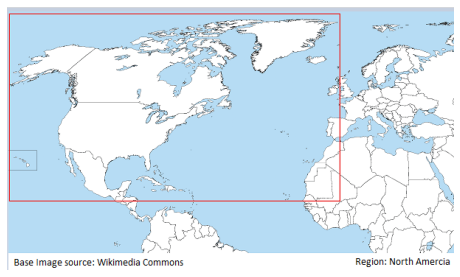

Region: 1 - North America, top_lat: 84, bottom_lat: 14, left_lon: 190, right_lon: 350


In [8]:
reg.show_region_by_ID(1)

### Areas of Interest (within region North America)

While the region is a good subset to work with, but for specific focus, the user may want to work with a more limited area as 'area-of-interest.

For this purpose, a few subset areas are implemented as Areas-of-interest. Here is the code to get a list of all areas-of-interest within the region 1.

In [9]:
reg.get_all_areas_of_interest_by_region_ID(1)

[{'aoi_id': 100,
  'area_of_interest': 'Mainland United States',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 49,
  'bottom_lat': 25,
  'left_lon': 235,
  'right_lon': 293,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Mainland_US.png'},
 {'aoi_id': 101,
  'area_of_interest': 'Upper Northeast US',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 46,
  'bottom_lat': 39,
  'left_lon': 280,
  'right_lon': 293,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Upper_Northeast_US.png'},
 {'aoi_id': 102,
  'area_of_interest': 'Lower Northeast US',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 39,
  'bottom_lat': 37,
  'left_lon': 271,
  'right_lon': 286,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Lower_Northeast_US.png'},
 {'aoi_id': 103,
  

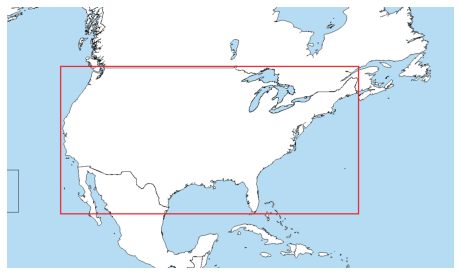

Area of Interest: 100 - Mainland United States, top_lat: 49, bottom_lat: 25, left_lon: 235, right_lon: 293


In [10]:
# visualize area of interest with ID 100 (Mainland United States)
reg.show_areas_of_interest_by_aoi_ID(100)

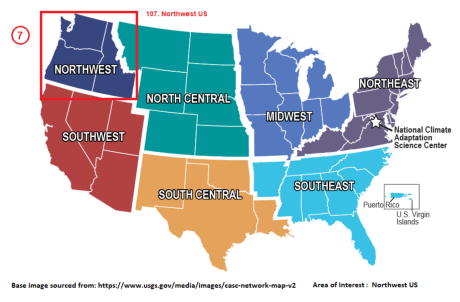

Area of Interest: 107 - Northwest US, top_lat: 49, bottom_lat: 42, left_lon: 235, right_lon: 249


In [11]:
# visualize area of interest with ID 107 (Northwest US)
reg.show_areas_of_interest_by_aoi_ID(107)

## Create Average Temperature file

One criteria of identifying extreme temperature events (heat waves) is to consider above average temperature. 

For this purpose, often a 30-year or a 50-year period is used as the duration from which to calculate average. 

The function **Interactive_GetAverageForRange()** code provides the complete functionality to generate such averages along with the record temperature, captured for each day in the underlying CMIP dataset.

### Create Average Temperature file -- locally, no azure; maximum temperature

In [4]:
start_year = 1950
end_year = 1969

# without Azure so make those parameters None
# averages file in azure
use_sas_token = None
use_azure_url = None

# cmip files - raw data from NASA site
name_prefix = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end

# url_prefix: remeber to update to tasmax or tasmin; provide without the filename
cmip_files_url = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'

model_name = 'GISS_E2_1_G'  # with underscores, without _historical at the end

avg_ds = Interactive_GetAverageForRange(start_year, end_year, cmip=6, result_type='max'
                           , model_name = model_name,azure_url_prefix=use_azure_url, sas_token=use_sas_token
                           , cmip_files_url=cmip_files_url, cmip_file_name_prefix=name_prefix, from_azure=False
                           , save_back_in_azure=False, interactive=True)
avg_ds

Get Average and Record max temperature for the range 1950 to 1969, for CMIP6, model GISS_E2_1_G


Do you want to continue? y/n y


01:07:06 UTC: Get Averages file Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
01:07:06 UTC: Available locally? No. Checking in Azure...
01:07:06 UTC: Azure url not provided, could not check there. Now preparing...
01:07:06 UTC: Arranging for all the component (10-year) files(s)
prepare_component_averages_files: filename:  Avg_temp_max_CMIP6_GISS_E2_1_G__10_yrs__1950_to_1959.nc
01:07:06 UTC: Component file 1 of 2 : --- 1950 to 1959 ----------
01:07:06 UTC: Component file available locally? No. Checking in Azure...
01:07:06 UTC: Component file also not in Azure, preparing...
1950
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1950.nc
1951
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1951.nc
1952
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1952.nc
1953
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1953.nc
1954
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1954.nc
1955
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1955.nc
1956
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1956.

<xarray.Dataset>
Dimensions:    (lat: 600, lon: 1440, day: 365)
Coordinates:
  * lat        (lat) float64 -59.88 -59.62 -59.38 -59.12 ... 89.38 89.62 89.88
  * lon        (lon) float64 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * day        (day) int64 1 2 3 4 5 6 7 8 9 ... 358 359 360 361 362 363 364 365
Data variables:
    tasmaxavg  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    tasmaxrec  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Dataset:           Average temperature CMIP6
    About dataset:     A dataset with average and record temparatures, across...
    Original values:   tasmax
    Data variables:    ['tasmaxavg', 'tasmaxrec']
    Data description:  Average and record maximum temperature, based on tasmax
    Range:             20 years
    Start year:        1950
    End year:          1969
    Years processed:   20
    Store as:          Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc

### Create Average Temperature file -- with azure; minimum temperature
NOTE: result_type paramater passed = 'min', and other changes (filename, url etc.)  
NOTE: also, using this time -- azure url and SAS token; save_back_in_azure=True

In [5]:
start_year = 1950
end_year = 1969

# without Azure so make those parameters None
# averages file in azure
use_sas_token = 'sp=racwdl&st=2021-11-16T20:32:44Z&se=2021-11-17T04:32:44Z&spr=https&sv=2020-08-04&sr=c&sig=KQJaq2KKfOY2KrFk%2BYm3VGTxQr4xma1VPBV4iBBwsVA%3D'
# Provide azure url with underscores
use_azure_url = 'https://nasanex30analysis.blob.core.windows.net/cmip6/averages/GISS_E2_1_G/'  # GFDL_ESM4 or GISS_E2_1_G etc.


# cmip files - raw data from NASA site
name_prefix = 'tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end

# url_prefix: remeber to update to tasmax or tasmin; provide without the filename
cmip_files_url = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/historical/r1i1p1f2/tasmin/'

model_name = 'GISS_E2_1_G'  # with underscores, without _historical at the end

avg_ds = Interactive_GetAverageForRange(start_year, end_year, cmip=6, result_type='min'
                           , model_name = model_name,azure_url_prefix=use_azure_url, sas_token=use_sas_token
                           , cmip_files_url=cmip_files_url, cmip_file_name_prefix=name_prefix, from_azure=False
                           , save_back_in_azure=True, interactive=True)
avg_ds

Get Average and Record min temperature for the range 1950 to 1969, for CMIP6, model GISS_E2_1_G


Do you want to continue? y/n y


21:24:32 UTC: Get Averages file Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
21:24:32 UTC: Available locally? No. Checking in Azure...
21:24:32 UTC: Also not in Azure Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc, preparing...
21:24:32 UTC: Arranging for all the component (10-year) files(s)
prepare_component_averages_files: filename:  Avg_temp_min_CMIP6_GISS_E2_1_G__10_yrs__1950_to_1959.nc
21:24:32 UTC: Component file 1 of 2 : --- 1950 to 1959 ----------
21:24:32 UTC: Component file available locally? No. Checking in Azure...
21:24:33 UTC: Component file also not in Azure, preparing...
1950
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1950.nc
1951
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1951.nc
1952
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1952.nc
1953
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1953.nc
1954
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1954.nc
1955
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1955.nc
1956
tasmin_day_GISS-E2-1-G_hist

<xarray.Dataset>
Dimensions:    (lat: 600, lon: 1440, day: 365)
Coordinates:
  * lat        (lat) float64 -59.88 -59.62 -59.38 -59.12 ... 89.38 89.62 89.88
  * lon        (lon) float64 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * day        (day) int64 1 2 3 4 5 6 7 8 9 ... 358 359 360 361 362 363 364 365
Data variables:
    tasminavg  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    tasminrec  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Dataset:           Average temperature CMIP6
    About dataset:     A dataset with average and record temparatures, across...
    Original values:   tasmin
    Data variables:    ['tasminavg', 'tasminrec']
    Data description:  Average and record minimum temperature, based on tasmin
    Range:             20 years
    Start year:        1950
    End year:          1969
    Years processed:   20
    Store as:          Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc

## Create Extreme Temperature data and file

### Create Extreme Temperature data and file -- locally, no azure; maximum temperature (Heat Wave)
NOTE: azure_url_prefix and sas_token are None  
NOTE: this attempt is for maximum temperature, i.e. for heatwaves, so result_type = 'max'

In [31]:
analysis_years = range(2020,2025)  # for a range of years
# analysis_years = [2020]          # or, for one or more specific years

for analysis_year in analysis_years:
    # filename prefixes, filenames
    name_prefix_1 = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end
    name_prefix_2 = 'tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_'                   # without the year at the end (GISS-E2-1-G_ssp245)
    
    if analysis_year < 2015:
        temp_filename = name_prefix_1 + str(analysis_year) + '.nc'                              # historical - with the year and extension
    else:
        temp_filename = name_prefix_2 + str(analysis_year) + '.nc'                              # model ssp245 - with the year and extension

    # url_prefix: remeber to update to tasmax or tasmin; provide without the filename
    cmip_files_url_1 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'
    cmip_files_url_2 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/ssp245/r1i1p1f2/tasmax/'   # GISS-E2-1-G_ssp245

    if analysis_year < 2015:
        cmip_files_url = cmip_files_url_1                              # historical
    else:
        cmip_files_url = cmip_files_url_2                              # model ssp245


#     azure_url_prefix = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Avg_yrs_1950_79/Abv_Avg_5_K_for_3_days'
    azure_url_prefix = None
    sas_token = None

    n_days = 3
    threshold = 4
    avgs_start = 1950
    avgs_end = 1969
    model_name='GISS_E2_1_G_ssp245'  # 'historical' / 'GISS_E2_1_G_ssp245' / 'GFDL_ESM4_ssp585' / 'HadGEM3_GC31_LL_ssp245'

    ds_ext, ds_avg_sub = Identify_1_year_Extreme_Temp_By_Region(analysis_year=analysis_year, threshold=threshold, result_type = 'max'
                                , based_on_averages=True, is_percentage=False
                                , n_continuous_days=n_days, cmip=6, model_name=model_name, region_id=1
                                , averages_start_year=avgs_start, averages_end_year=avgs_end
                                , azure_url_extremes=azure_url_prefix, sas_token=sas_token
                                , azure_url_averages=None, azure_url_1_year_temp=None, url_1_year_temp=cmip_files_url
                                                            , temp_filename= temp_filename
                                , remove_source_files=True, area_of_interest=None, name_of_area_of_interest=None
                                , interactive=False, print_extra_msg=False)



Get Extreme maximum temperature identification data
 ... for the year 2020,
 ... for the region 1-North America
 ... for model GISS_E2_1_G_ssp245 of CMIP6
 ... for 4 Kelvin above average from the years 1950 to 1969
 ... when observed for 3 continuous days

23:57:50 UTC: Extreme temperature data filename: Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc
23:57:50 UTC: Already available locally? No. Checking in Azure...
23:57:50 UTC: URL not provided to check in Azure. Preparing the Extreme temp data file... 
23:57:50 UTC: Working with 1_year temperature filename: tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_2020.nc
23:57:50 UTC: Available locally? Yes
23:57:50 UTC: Working with Averages filename: Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
23:57:50 UTC: Available locally? Yes
23:57:50 UTC: Getting subset of applicable region, apply threshold...
23:57:55 UTC: Preparing extreme temperature data...
23:58:01 UTC: Saved locally: Extreme tem

### Analyze and Visual Extreme Temperature results -- locally, no azure; maximum temperature (Heat Wave)

Region 1, no specific area of interest

Extreme Temperature Base Results for: 
region_id: 1; Analysis year: 2020; threshold: 4; based_on_averages: True; is_percentage: False; averages_start_year: 1950; averages_end_year: 1969; 
** from the filename:  Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc **


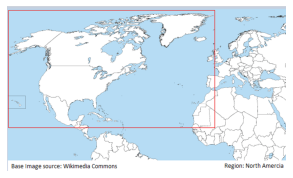

Region: 1 - North America, top_lat: 84, bottom_lat: 14, left_lon: 190, right_lon: 350

Dataset:
---------------
 dimensions:  Frozen({'time': 365, 'lat': 284, 'lon': 644}) 
 coordinates:  Coordinates:
  * time     (time) object 2020-01-01 12:00:00 ... 2020-12-31 12:00:00
  * lat      (lat) float64 14.12 14.38 14.62 14.88 ... 84.12 84.38 84.62 84.88
  * lon      (lon) float64 190.1 190.4 190.6 190.9 ... 350.1 350.4 350.6 350.9 
 variables:  Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ... 

Grid cells 
---------------
Grid cells for each day are: lat x lon (284 x 644) = 182,896

Note: for cmip 6, the temperature values are provided for only the grid cells covering the land area. 
...temperature values for the grid cells overlapping the sea are nan (not provided).


In [3]:
# user provided parameters:
ext_filename = 'Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc'
region_id = 1
area_of_interest = None   # provide id,or None

# code starts.
ds_ext = None

reg = Regions()
if area_of_interest is not None:    
    aoi = reg.get_area_of_interest_by_ID(area_of_interest)
    if aoi is not None:
        reg.show_areas_of_interest_by_aoi_ID(area_of_interest, figure_size=5)
        ds_ext = load_1_yr_results_and_basic_analysis(ext_filename, True, aoi)
    else:
        print('Specified area_of_interest ID, {}, does not exist'.format(area_of_interest))
else:
    ds_ext = load_1_yr_results_and_basic_analysis(ext_filename, True)
    reg.show_region_by_ID(ds_ext.attrs['region_id'], figure_size=5)    

print('\nDataset:\n{}\n'.format('-'*15),'dimensions: ', ds_ext.dims, '\n', 'coordinates: ', ds_ext.coords, '\n','variables: ', ds_ext.data_vars, '\n')

lat = ds_ext.dims['lat']
lon = ds_ext.dims['lon']

print('Grid cells \n{}'.format('-'*15))
print('Grid cells for each day are: lat x lon ({} x {}) = {:,d}'.format(lat, lon, (lat*lon)))
if ds_ext.attrs['cmip'] == 6:
    print('\nNote: for cmip 6, the temperature values are provided for only the grid cells covering the land area. \n...temperature values for the grid cells overlapping the sea are nan (not provided).')

## Visualizations

In [4]:
summer_start = '5/1/2020'   # must be mm/dd/yyyy ---- or a datetime, or a cftime.DatetimeNoLeap object
summer_end = '9/30/2020'
summer = datewise_subset(ds_ext, summer_start, summer_end)
summer

<xarray.Dataset>
Dimensions:          (time: 153, lat: 284, lon: 644)
Coordinates:
  * time             (time) object 2020-05-01 12:00:00 ... 2020-09-30 12:00:00
  * lat              (lat) float64 14.12 14.38 14.62 14.88 ... 84.38 84.62 84.88
  * lon              (lon) float64 190.1 190.4 190.6 190.9 ... 350.4 350.6 350.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

In [22]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region_in_polar(summer, 61, 65, 1, 'tasmax')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [10]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region_in_polar(summer, 61, 65, 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [11]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region_in_polar(summer, 61, 65, 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [10]:
one_day = get_results_for_lat_lon(summer, lat=42, lon=246, year=2020, month=6, day=30, also_print=True)

Coordinates:
  * time     (time) object 2020-06-30 12:00:00
  * lat      (lat) float64 42.12
  * lon      (lon) float64 246.1
tasmax
303.6123046875
above_threshold
-0.797699
extreme_yn
0.0


### Get focused results on a subset -- area of interest 107: Northwest US

In [11]:
aoi = reg.get_area_of_interest_by_ID(107)
aoi

{'aoi_id': 107,
 'area_of_interest': 'Northwest US',
 'region_id': 1,
 'region_name': 'North America',
 'top_lat': 49,
 'bottom_lat': 42,
 'left_lon': 235,
 'right_lon': 249,
 'may_to_oct_range': (265, 325),
 'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Northwest_US.png'}

In [12]:
aoi_107_summer = region_subset(ds_full=summer, top_lat=aoi['top_lat'], bottom_lat=aoi['bottom_lat'], left_lon=aoi['left_lon'], right_lon=aoi['right_lon'])
aoi_107_summer

<xarray.Dataset>
Dimensions:          (time: 153, lat: 32, lon: 60)
Coordinates:
  * time             (time) object 2020-05-01 12:00:00 ... 2020-09-30 12:00:00
  * lat              (lat) float64 42.12 42.38 42.62 42.88 ... 49.38 49.62 49.88
  * lon              (lon) float64 235.1 235.4 235.6 235.9 ... 249.4 249.6 249.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

In [13]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107_summer, 61, 65, 1, 'tasmax')
pane

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/crs.py

TypeError: 'dict' object is not callable

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [12]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107_summer, 61, 65, 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [13]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107_summer, 61, 65, 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

### Create Extreme Temperature data and file -- locally, no azure; maximum temperature (Heat Wave) -- No Averages
NOTE: azure_url_prefix and sas_token are None  
NOTE: based_on_averages is to be False this time  
NOTE: this attempt is for maximum temperature, i.e. for heatwaves, so result_type = 'max'

In [19]:
# analysis_years = range(2020,2025)  # for a range of years
analysis_years = [2020]          # or, for one or more specific years

for analysis_year in analysis_years:
    # filename prefixes, filenames
    name_prefix_1 = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end
    name_prefix_2 = 'tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_'                   # without the year at the end (GISS-E2-1-G_ssp245)
    
    if analysis_year < 2015:
        temp_filename = name_prefix_1 + str(analysis_year) + '.nc'                              # historical - with the year and extension
    else:
        temp_filename = name_prefix_2 + str(analysis_year) + '.nc'                              # model ssp245 - with the year and extension

    # url_prefix: remeber to update to tasmax or tasmin; provide without the filename
    cmip_files_url_1 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'
    cmip_files_url_2 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/ssp245/r1i1p1f2/tasmax/'   # GISS-E2-1-G_ssp245

    if analysis_year < 2015:
        cmip_files_url = cmip_files_url_1                              # historical
    else:
        cmip_files_url = cmip_files_url_2                              # model ssp245


#     azure_url_prefix = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Avg_yrs_1950_79/Abv_Avg_5_K_for_3_days'
    azure_url_prefix = None
    sas_token = None

    n_days = 3
    threshold = 305
    avgs_start = 1950
    avgs_end = 1969
    model_name='GISS_E2_1_G_ssp245'  # 'historical' / 'GISS_E2_1_G_ssp245' / 'GFDL_ESM4_ssp585' / 'HadGEM3_GC31_LL_ssp245'

    ds_ext, ds_avg_sub = Identify_1_year_Extreme_Temp_By_Region(analysis_year=analysis_year, threshold=threshold, result_type = 'max'
                                , based_on_averages=False, is_percentage=False
                                , n_continuous_days=n_days, cmip=6, model_name=model_name, region_id=1
                                , averages_start_year=avgs_start, averages_end_year=avgs_end
                                , azure_url_extremes=azure_url_prefix, sas_token=sas_token
                                , azure_url_averages=None, azure_url_1_year_temp=None, url_1_year_temp=cmip_files_url
                                                            , temp_filename= temp_filename
                                , remove_source_files=True, area_of_interest=None, name_of_area_of_interest=None
                                , interactive=False, print_extra_msg=False)



Get Extreme maximum temperature identification data
 ... for the year 2020,
 ... for the region 1-North America
 ... for model GISS_E2_1_G_ssp245 of CMIP6
 ... for temperature above 305 Kelvin
 ... when observed for 3 continuous days

03:15:31 UTC: Extreme temperature data filename: Ext_max_t__Rgn_1__2020__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc
03:15:31 UTC: Already available locally? Yes
Complete execution time | Identify_1_year_Extreme_Temp_By_Region | (mins) 0.00


In [20]:
aoi_107 = region_subset(ds_full=ds_ext, top_lat=aoi['top_lat'], bottom_lat=aoi['bottom_lat'], left_lon=aoi['left_lon'], right_lon=aoi['right_lon'])
aoi_107

<xarray.Dataset>
Dimensions:          (time: 365, lat: 32, lon: 60)
Coordinates:
  * time             (time) object 2020-01-01 12:00:00 ... 2020-12-31 12:00:00
  * lat              (lat) float64 42.12 42.38 42.62 42.88 ... 49.38 49.62 49.88
  * lon              (lon) float64 235.1 235.4 235.6 235.9 ... 249.4 249.6 249.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

In [27]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107, 105, 106, 1, 'tasmax')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-04-15 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [28]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107, 105, 106, 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-04-15 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

In [29]:
%%capture --no-display
print('interactive visual, will take some time to render...')

pane = interactive_visual_region_in_polar(aoi_107, 105, 106, 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-04-15 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()